# Лекция: Компьютерное зрение. 
## GAN & VAE. Часть 2.
**Преподаватель**: Шевченко Елена, Т-Банк

**Аудитория**: ФКН ВШЭ, МФТИ

### Содержание
1. ~~VAE: FOUNDATIONS~~
2. ~~VAE: DISCRETIZATION (VQ-VAE)~~
3. GAN BASICS
    - GAN
    - DCGAN
    - WGAN
4. GAN: SCALING UP (BigGAN, StyleGAN, CycleGAN)
   - BigGAN
   - StyleGAN
   - CycleGAN
5. HYBRID MODELS (VAE + GAN)
   - VQ_GAN

# 3. GAN BASICS
![gan_ar](assets/gan_architect.png)

## 3.1 Generative Adversarial Network (GAN)
Постановка задачи GAN
### Проблемы генерации данных

Основная задача генеративных моделей — научиться создавать **новые данные**, похожие на реальные.  

**Важные вопросы:**

- Как заставить модель создавать **реалистичные изображения**?  
- Как оценивать качество генерации?  
- Как избежать проблем, когда генератор просто повторяет обучающие данные?

**Особенность GAN:**
- Вместо прямого максимизации вероятности данных (как в VAE) GAN использует **соревновательную игру** двух сетей.

---

### Идея GAN — игра двух сетей

Идея: чтобы делать реалистичные изображения, нужно, чтобы они были неотличимы от реальных
=> нужен некоторый классификатор, который мы должны успешно обманывать. 

#### Неформально:

![gan2](assets/gan2.png)

1. Генератор: создает данные из шума

2. Дискриминатор: получает и сгенерированный пример, и настоящий образец данных, анализирует каждый из них отдельно и определяет, что перед ним — «реальные данные» или «подделка».

3. Обучение на основе обратной связи: Получив обратную связь от дискриминатора, генератор корректирует свои параметры. Если дискриминатор правильно распознал подделку, генератор «понимает», где ошибся, и в следующий раз старается сгенерировать более правдоподобные данные.

4. Непрерывный цикл обучения: Этот процесс повторяется снова и снова. Генератор постепенно улучшает качество своих данных, а дискриминатор — способность отличать реальные примеры от сгенерированных.

#### Формально:

Если дискриминатор оптимален, то обучение генератора **эквивалентно минимизации JS-дивергенции**: $\min_G {JS}(p_\text{data} \,||\, p_g)$
> $$ {JS}(P||Q) = \frac{1}{2} {KL}(P||M) + \frac{1}{2} {KL}(Q||M)$$ где: $$ M = \frac{1}{2}(P + Q) $$
- **Генератор $G$** — создаёт изображения из шума $z \sim p_z(z)$  
- **Дискриминатор $D$** — отличает реальные данные от сгенерированных
- Обучение формулируется как **min-max игра**:

$$
\min_G \max_D V(D, G) = 
\mathbb{E}_{x \sim p_\text{data}(x)}[\log D(x)] + 
\mathbb{E}_{z \sim p_z(z)}[\log (1 - D(G(z)))]
$$
> можно доказать, что $$
\boxed{
\min_G \max_D V(D,G)
\;\;\Longleftrightarrow\;\;
\min_G {JS}(p_\text{data} \,||\, p_g)
}
$$

- $x \sim p_\text{data}(x)$ — реальные данные  
- $z \sim p_z(z)$ — случайный шум  
- $G(z)$ — сгенерированное изображение  
- $D(x) \in [0,1]$ — вероятность того, что $x$ реально


> Генератор пытается минимизировать свою ошибку, создавая всё более реалистичные данные, которые смогут «обмануть» дискриминатор.  
Дискриминатор пытается максимизировать общую функцию, улучшая способность отличать поддельные данные от настоящих.

---

### Алгоритм обучения GAN

1. Выбираем мини-батч настоящих данных $x$ и шума $z$  
2. Обновляем **дискриминатор** $D$:

$$
\theta_D \leftarrow \theta_D + \eta \nabla_{\theta_D} \Big[ \log D(x) + \log(1 - D(G(z))) \Big]
$$

3. Обновляем **генератор** $G$:

$$
\theta_G \leftarrow \theta_G - \eta \nabla_{\theta_G} \log(1 - D(G(z)))
$$

- Часто используют альтернативную функцию потерь для генератора:

$$
\theta_G \leftarrow \theta_G + \eta \nabla_{\theta_G} \log D(G(z))
$$

___

### Проблемы стандартного GAN

| Проблема | Что происходит | Последствие |
|----------|----------------|------------|
| **Градиенты исчезают/взрываются** | D слишком сильный или слабый | G перестаёт учиться или градиенты нестабильны |
| **Mode collapse** | G находит "короткий путь", выдавая однотипные примеры | Генератор не охватывает все моды данных |
| **JS-дивергенция** | Не пересекающиеся распределения → $\text{JS}(p_\text{data} \,||\, p_g) = \log 2 $ → $ \nabla_\theta \text{JS}(p_\text{data} \,||\, p_g) = 0 $ | Стандартный GAN не обучается на старте |


**Решения:**  
- Использовать DCGAN (CNN-архитектура для стабильного обучения)  
- WGAN (Wasserstein distance вместо JS)  

---

### Интуитивная аналогия с VAE

- В VAE: мы **явно моделируем $p(x|z)$** и максимизируем правдоподобие через ELBO  
- В GAN: мы **неявно моделируем $p_g(x)$** через игру $G$ и $D$, без явного распределения  


Epoch 0: D_loss=0.063, G_loss=4.257


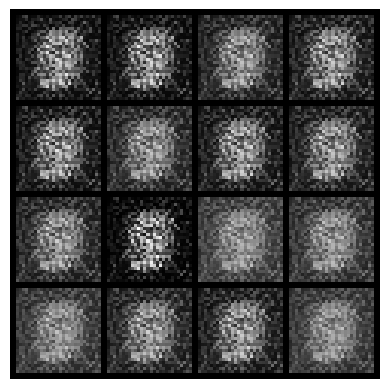

Epoch 10: D_loss=0.282, G_loss=4.366


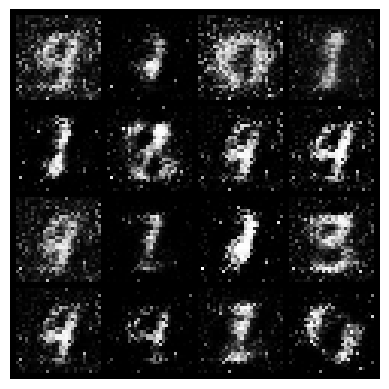

Epoch 20: D_loss=0.324, G_loss=3.509


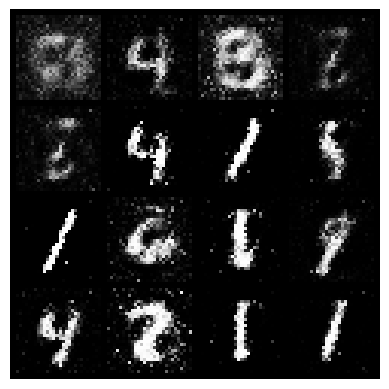

Epoch 30: D_loss=0.556, G_loss=3.025


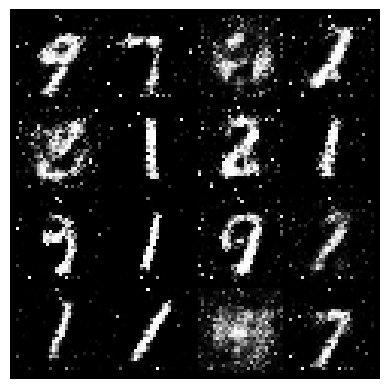

Epoch 40: D_loss=0.696, G_loss=2.216


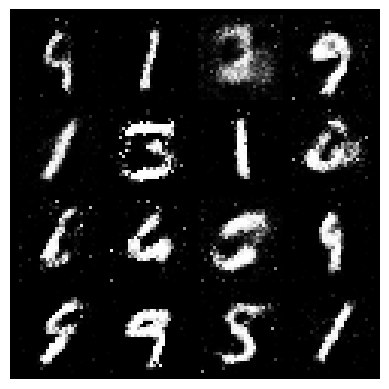

In [13]:
# ===============================
# GAN на MNIST (MLP)
# ===============================
import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"

# -----------------------
# Dataset
# -----------------------
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])  # [-1,1]
])

mnist = datasets.MNIST(root="./data", train=True, download=True, transform=transform)
dataloader = DataLoader(mnist, batch_size=64, shuffle=True)

# -----------------------
# GAN Models
# -----------------------
z_dim = 100

class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(z_dim, 256),
            nn.ReLU(),
            nn.Linear(256, 512),
            nn.ReLU(),
            nn.Linear(512, 784),
            nn.Tanh()
        )
    def forward(self, z):
        return self.net(z)

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(784, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256,1),
            nn.Sigmoid()
        )
    def forward(self, x):
        return self.net(x)

G = Generator().to(device)
D = Discriminator().to(device)

# -----------------------
# Loss + Optimizers
# -----------------------
bce = nn.BCELoss()
g_opt = optim.Adam(G.parameters(), lr=2e-4)
d_opt = optim.Adam(D.parameters(), lr=2e-4)

# -----------------------
# Training Loop
# -----------------------
epochs = 50  # для примера

for epoch in range(epochs):
    G.train()
    for real, _ in dataloader:
        real = real.view(real.size(0), -1).to(device)
        batch_size = real.size(0)

        # Train Discriminator
        z = torch.randn(batch_size, z_dim).to(device)
        fake = G(z)
        D_real = D(real)
        D_fake = D(fake.detach())
        d_loss = bce(D_real, torch.ones_like(D_real)) + bce(D_fake, torch.zeros_like(D_fake))
        d_opt.zero_grad()
        d_loss.backward()
        d_opt.step()

        # Train Generator
        z = torch.randn(batch_size, z_dim).to(device)
        fake = G(z)
        D_fake = D(fake)
        g_loss = bce(D_fake, torch.ones_like(D_fake))
        g_opt.zero_grad()
        g_loss.backward()
        g_opt.step()
    if epoch % 10 == 0:
        print(f"Epoch {epoch}: D_loss={d_loss.item():.3f}, G_loss={g_loss.item():.3f}")
        G.eval()
        z = torch.randn(16, z_dim).to(device)
        fake = G(z).view(-1,1,28,28)
        grid = torchvision.utils.make_grid(fake, nrow=4, normalize=True)
        plt.imshow(grid.permute(1,2,0).cpu())
        plt.axis('off')
        plt.show()

# -----------------------
# Sample Generation
# -----------------------
# G.eval()
# z = torch.randn(16, z_dim).to(device)
# fake = G(z).view(-1,1,28,28)
# grid = torchvision.utils.make_grid(fake, nrow=4, normalize=True)
# plt.imshow(grid.permute(1,2,0).cpu())
# plt.axis('off')
# plt.show()

## 3.2 DCGAN: архитектура CNN

![dcgan](assets/dcgan.png)

**DCGAN (Radford et al., 2015)** — первая архитектура GAN, которая обеспечила
**стабильное обучение** и качественную генерацию изображений за счет использования CNN
и строгих архитектурных правил.

**До DCGAN:**

Оригинальный GAN (Goodfellow et al., 2014):
- Использовал MLP (fully-connected layers)
- Нестабильное обучение
- Mode collapse — частая проблема
- Низкое качество изображений
- Отсутствие стандартов архитектуры
- ❌ Не использует spatial structure изображений
- ❌ Огромное количество параметров
- ❌ Нет translation invariance
- ❌ Плохое качество

**DCGAN: революция**

Radford et al., 2015** показали, что:
1. CNN работают для GAN!
2. Существуют архитектурные правила, которые обеспечивают стабильность
3. GAN могут генерировать реалистичные изображения (64×64, faces, bedrooms)

**Ключевая идея:**
$$
\text{MLP} \rightarrow \text{CNN} = \text{стабильное обучение}
$$


---

### Архитектура Generator

Генератор постепенно увеличивает размер изображения:

$$
z \rightarrow x
$$

Типичная архитектура:

z (100)

Dense → Reshape (4×4×1024)

ConvTranspose → BatchNorm → ReLU  
ConvTranspose → BatchNorm → ReLU  
ConvTranspose → BatchNorm → ReLU  
ConvTranspose → Tanh  

---

### Архитектура Discriminator

Дискриминатор уменьшает изображение до вероятности:

$$
x \rightarrow D(x)
$$

Типичная архитектура:

Conv → LeakyReLU  
Conv → BatchNorm → LeakyReLU  
Conv → BatchNorm → LeakyReLU  
Conv → Sigmoid  



---

### Ключевые правила DCGAN

1. Использовать strided convolution вместо pooling
   - MaxPooling / AveragePooling  -> strided Conv / ConvTranspose


2. Использовать Batch Normalization
    - после каждого скрытого слоя


3. Не использовать скрытые fully-connected слои
   - могут быть только первым в генераторе или завершать дискриминатор



4. Функции активации
   - Generator: $$ \text{ReLU}, \quad \text{Tanh (output)} $$
   - Discriminator: $$ \text{LeakyReLU}, \quad \text{Sigmoid} $$


5. Нормализация данных $$ x \in [-1,1] $$
   - Поэтому: Generator output = Tanh


### Почему DCGAN стал важным шагом развития

DCGAN впервые показал:

- стабильное обучение GAN  
- реалистичные изображения  
- воспроизводимые архитектурные правила  

Фактически:

$$
\text{DCGAN} = \text{первый практический стандарт для GAN}
$$

Epoch 0: D_loss=0.302, G_loss=2.206


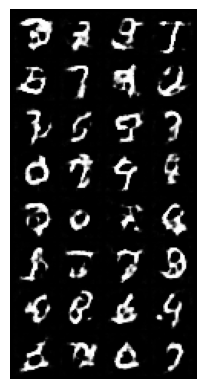

Epoch 10: D_loss=0.435, G_loss=4.258


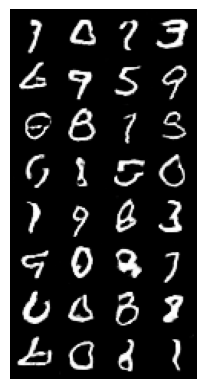

Epoch 20: D_loss=0.248, G_loss=2.496


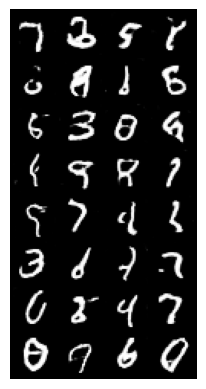

Epoch 30: D_loss=0.285, G_loss=3.402


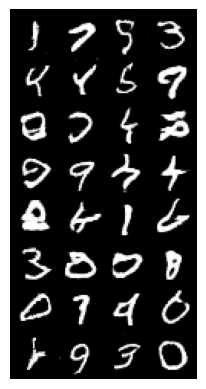

Epoch 40: D_loss=0.317, G_loss=2.361


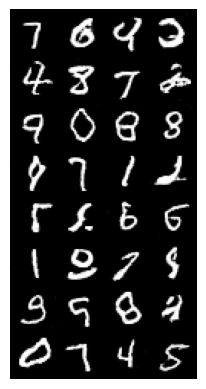

In [20]:
# ===============================
# DCGAN на MNIST (CNN)
# ===============================
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, utils
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"

# -----------------------
# Dataset
# -----------------------
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])
mnist = datasets.MNIST(root="./data", train=True, download=True, transform=transform)
dataloader = DataLoader(mnist, batch_size=64, shuffle=True)

# -----------------------
# DCGAN Models
# -----------------------
z_dim = 100

class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(z_dim, 128, 7, 1, 0),  # z -> 128 x 7 x 7
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1),     # 64 x 14 x 14
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 1, 4, 2, 1),       # 1 x 28 x 28
            nn.Tanh()
        )
    def forward(self, z):
        return self.net(z)

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(1,64,4,2,1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64,128,4,2,1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128,1,7,1,0),  # 7x7 -> 1x1
            nn.Sigmoid()
        )
    def forward(self, x):
        return self.net(x).view(-1,1)

G = Generator().to(device)
D = Discriminator().to(device)

# -----------------------
# Loss + Optimizers
# -----------------------
bce = nn.BCELoss()
g_opt = optim.Adam(G.parameters(), lr=2e-4, betas=(0.5,0.999))
d_opt = optim.Adam(D.parameters(), lr=2e-4, betas=(0.5,0.999))

# -----------------------
# Training Loop
# -----------------------
epochs = 50  # для примера

for epoch in range(epochs):
    G.train()
    for real, _ in dataloader:
        real = real.to(device)
        batch_size = real.size(0)

        # Train Discriminator
        z = torch.randn(batch_size, z_dim,1,1).to(device)
        fake = G(z)
        D_real = D(real)
        D_fake = D(fake.detach())
        d_loss = bce(D_real, torch.ones_like(D_real)) + bce(D_fake, torch.zeros_like(D_fake))
        d_opt.zero_grad()
        d_loss.backward()
        d_opt.step()

        # Train Generator
        z = torch.randn(batch_size, z_dim,1,1).to(device)
        fake = G(z)
        D_fake = D(fake)
        g_loss = bce(D_fake, torch.ones_like(D_fake))
        g_opt.zero_grad()
        g_loss.backward()
        g_opt.step()

    if epoch % 10 == 0:
        print(f"Epoch {epoch}: D_loss={d_loss.item():.3f}, G_loss={g_loss.item():.3f}")
        G.eval()
        z = torch.randn(batch_size, z_dim, 1, 1).to(device)
        fake = G(z)
        grid = torchvision.utils.make_grid(fake, nrow=4, normalize=True)
        plt.imshow(grid.permute(1,2,0).cpu())
        plt.axis('off')
        plt.show()

## 3.3 WGAN: расстояние Вассерштейна и gradient penalty

**WGAN (Arjovsky et al., 2017)** — модификация GAN, которая улучшает стабильность
обучения и решает проблему исчезающего градиента.

![wgan_g](assets/wgan.png)

---

### Основная идея: расстояние Вассерштейна

В стандартном GAN используется JS-дивергенция:

$$
\min_G \max_D \mathbb{E}_{x \sim p_{data}}[\log D(x)] + 
\mathbb{E}_{z \sim p_z}[\log (1 - D(G(z)))]
$$

- Проблема: JS-дивергенция может иметь постоянное значение log2, если распределения не перекрываются.  
- Решение: использовать **расстояние Вассерштейна (Earth Mover distance)**:

$$
W(p_r, p_g) = \inf_{\gamma \in \Pi(p_r, p_g)} \mathbb{E}_{(x,y)\sim\gamma} [||x - y||]
$$

где:

- $p_r$ — распределение реальных данных  
- $p_g$ — распределение генератора  
- $\Pi(p_r, p_g)$ — все совместные распределения с маргиналами $p_r$ и $p_g$ (все возможные способы сопоставить точки одного распределения точкам другого,
не меняя сами распределения)
- $\|x-y\|$ — стоимость перемещения

Интуиция:


сколько "работы" нужно,
чтобы превратить одно распределение в другое

---

### WGAN с параметрическим критиком

Используем **Критик $f_w$** вместо дискриминатора:


$$
W(p_r, p_g) \approx \max_{w: \|f_w\|_L \leq 1} \mathbb{E}_{x \sim p_r}[f_w(x)] - \mathbb{E}_{z \sim p_z}[f_w(G_\theta(z))]
$$


- Discriminator: оценивает вероятность «реально / фейк»
- Critic:оценивает качество по шкале
- Главное требование: **$f_w$ должно быть 1-Lipschitz**.
> Функция $f: \mathbb{R}^n \to \mathbb{R}$ называется **Lipschitz** с константой K, если для любых $x_1, x_2$ выполняется: $$|f(x_1) - f(x_2)| \le K \, \|x_1 - x_2\|$$
> - K — это **верхняя граница на скорость изменения функции** $\|\nabla f(x)\| \le K$
> - Иными словами: **функция не может меняться слишком резко**.


**Роль критика:** 
Критик $𝑓_𝑤$ — это нейросеть, которая учится ставить более высокие значения реальным данным, чем сгенерированным,
настолько сильно, насколько это разрешает ограничение 1-Lipschitz.

А затем:
разница средних значений этих оценок используется как оценка расстояния Вассерштейна.

---

### Gradient Penalty (WGAN-GP)

Чтобы обеспечить Lipschitz ограничение, вместо weight clipping используют **gradient penalty** (Gulrajani et al., 2017):

$$
\mathcal{L}_{GP} = \lambda \, \mathbb{E}_{\hat{x} \sim P_{\hat{x}}} 
\big[ (\|\nabla_{\hat{x}} f_w(\hat{x})\|_2 - 1)^2 \big]
$$

где:

- $\hat{x} = \epsilon x + (1-\epsilon) \tilde{x}$ — случайная точка между
  реальными $x \sim p_r$ и сгенерированными $\tilde{x} = G(z)$
- $\lambda$ — коэффициент регуляризации, обычно $\lambda = 10$

---

### Итоговая функция WGAN-GP

**Критик**

$$
\mathcal{L}_{\text{Critic}} = \underbrace{\mathbb{E}_{\tilde{x} \sim p_g}[f_w(\tilde{x})] - \mathbb{E}_{x \sim p_r}[f_w(x)]}_{\text{Wasserstein loss}} + \underbrace{\lambda \, \mathbb{E}_{\hat{x} \sim P_{\hat{x}}} \big[ (\|\nabla_{\hat{x}} f_w(\hat{x})\|_2 - 1)^2 \big]}_{\text{Gradient penalty}}
$$

**Интуиция:**
- Первый член: **минимизируем** (хотим $f_w(\text{fake})$ маленьким, $f_w(\text{real})$ большим)
- Второй член: **регуляризация** (градиент должен быть ≈1)


**Генератор**

$$
\mathcal{L}_G = - \mathbb{E}_{z \sim p_z} [f_w(G(z))]
$$


---

### Ключевые преимущества WGAN

1. **Стабильность обучения**  
   — градиенты критика не исчезают, даже если распределения не пересекаются.

2. **Интерпретируемая loss-функция**  
   — значение loss коррелирует с качеством генерации.

3. **Gradient penalty**  
   — мягкое ограничение Lipschitz, лучше, чем weight clipping.

Epoch 1: C_loss=-5.097, G_loss=-5.882


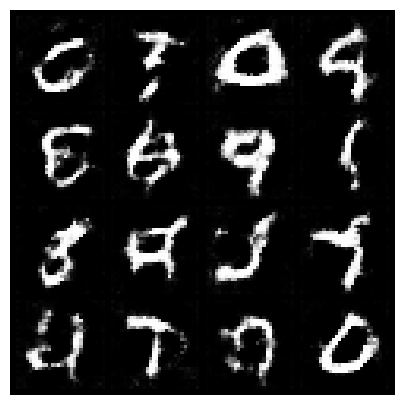

Epoch 11: C_loss=-3.455, G_loss=-1.003


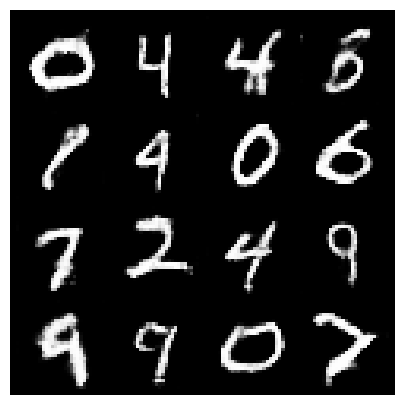

Epoch 21: C_loss=-3.006, G_loss=-0.250


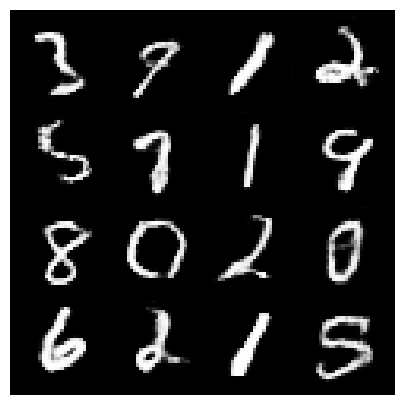

Epoch 31: C_loss=-2.395, G_loss=-9.397


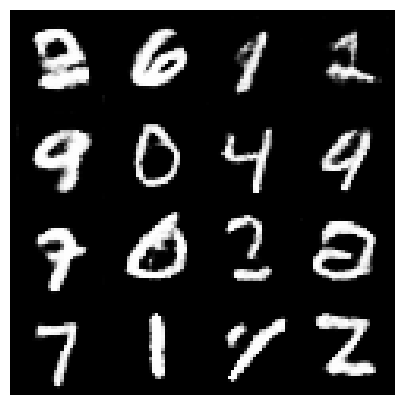

Epoch 41: C_loss=-3.066, G_loss=-5.041


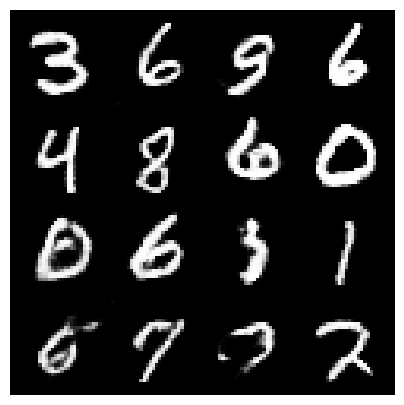

In [17]:
# ===============================
# WGAN-GP на MNIST (CNN)
# ===============================
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, utils
from torch.utils.data import DataLoader
import torch.autograd as autograd
import matplotlib.pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"

# -----------------------
# Dataset
# -----------------------
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])
mnist = datasets.MNIST(root="./data", train=True, download=True, transform=transform)
dataloader = DataLoader(mnist, batch_size=64, shuffle=True)

# -----------------------
# WGAN-GP Models
# -----------------------
z_dim = 100

class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.ConvTranspose2d(z_dim, 128, 7, 1, 0),   # z -> 128 x 7 x 7
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, 4, 2, 1),      # 64 x 14 x 14
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 1, 4, 2, 1),        # 1 x 28 x 28
            nn.Tanh()
        )
    def forward(self, z):
        return self.net(z)

class Critic(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(1,64,4,2,1),      # 28 -> 14
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64,128,4,2,1),    # 14 -> 7
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128,256,3,1,0),   # 7 -> 5
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256,1,5,1,0)      # 5 -> 1
        )
    def forward(self,x):
        return self.net(x).view(-1,1)

G = Generator().to(device)
C = Critic().to(device)

# -----------------------
# Optimizers
# -----------------------
g_opt = optim.Adam(G.parameters(), lr=1e-4, betas=(0.0,0.9))
c_opt = optim.Adam(C.parameters(), lr=1e-4, betas=(0.0,0.9))

# -----------------------
# Gradient Penalty
# -----------------------
def gradient_penalty(critic, real, fake, lambda_gp=10):
    batch_size = real.size(0)
    epsilon = torch.rand(batch_size,1,1,1).to(device)
    x_hat = epsilon*real + (1-epsilon)*fake
    x_hat.requires_grad_(True)
    critic_hat = critic(x_hat)
    gradients = autograd.grad(outputs=critic_hat, inputs=x_hat,
                              grad_outputs=torch.ones_like(critic_hat),
                              create_graph=True, retain_graph=True)[0]
    gradients = gradients.view(batch_size, -1)
    gp = ((gradients.norm(2,dim=1)-1)**2).mean()
    return lambda_gp * gp

# -----------------------
# Training Loop
# -----------------------
epochs = 41
n_critic = 5

for epoch in range(epochs):
    for real, _ in dataloader:
        real = real.to(device)
        batch_size = real.size(0)

        # Train Critic
        for _ in range(n_critic):
            z = torch.randn(batch_size, z_dim,1,1).to(device)
            fake = G(z)
            critic_real = C(real)
            critic_fake = C(fake.detach())
            gp = gradient_penalty(C, real, fake)
            c_loss = critic_fake.mean() - critic_real.mean() + gp
            c_opt.zero_grad()
            c_loss.backward()
            c_opt.step()

        # Train Generator
        z = torch.randn(batch_size, z_dim,1,1).to(device)
        fake = G(z)
        g_loss = -C(fake).mean()
        g_opt.zero_grad()
        g_loss.backward()
        g_opt.step()
    if epoch % 10 == 0:
        print(f"Epoch {epoch+1}: C_loss={c_loss.item():.3f}, G_loss={g_loss.item():.3f}")
        G.eval()
        z = torch.randn(16, z_dim,1,1).to(device)
        fake = G(z)
        grid = utils.make_grid(fake, nrow=4, normalize=True)
        plt.figure(figsize=(5,5))
        plt.imshow(grid.permute(1,2,0).cpu())
        plt.axis('off')
        plt.show()

# 4 GAN: SCALING UP

## 4.1 BigGAN

![biggan](assets/biggan.png)
### Идея

**BigGAN** — это масштабируемая архитектура GAN, показавшая, что:

Основные нововведения:

1. **Очень большие модели** (large batch, много параметров)
2. **Class-conditional**
3. **Self-Attention**
4. **Spectral Normalization**
5. **Truncation trick**

Модель была представлена в:

**Brock et al., 2019 — "Large Scale GAN Training for High Fidelity Natural Image Synthesis"**

---

### Постановка задачи

BigGAN — это **conditional GAN**:

Generator получает:

$ z \sim \mathcal{N}(0, I) $ и метку класса $y \in \{1, \dots, K\}$

Тогда генерация:

$$
x_{fake} = G(z, y)
$$

Дискриминатор (работает как критик):

$$
D(x, y) ∈ R
$$

оценивает:

- изображение
- класс

---

### Loss функция

Используется **hinge loss** (стабильнее BCE):

#### Discriminator (Hinge Loss)
$$
\mathcal{L}_D = \mathbb{E}_{(x,y) \sim p_r}[\max(0, 1 - D(x, y))] + \mathbb{E}_{z \sim p(z), y \sim p(y)}[\max(0, 1 + D(G(z, y), y))]
$$

**Интуиция hinge loss**

Дискриминатор должен обеспечить:

$$ D(real) \ge 1 \text{ и  } D(fake) \le -1 $$

То есть:

```
  fake         boundary        real
----|-------------|-------------|----
   -1             0            +1
```


#### Generator
$$
\mathcal{L}_G = -\mathbb{E}_{z \sim p(z), y \sim p(y)}[D(G(z, y), y)]
$$

_____

### Архитектура Generator

BigGAN использует:

#### Residual blocks + upsampling

$$
y = \text{Conv}_2(\text{ReLU}(\text{CBN}(\text{Conv}_1(\text{Upsample}(x)), y))) + \text{Conv}_{skip}(\text{Upsample}(x))
$$

где $\text{CBN}(\cdot, y)$ — Conditional Batch Normalization с классом $y$.


```
              x
              │
              │
              ├───────────────┐
              │               │
          Upsample         Upsample
              │               │
            Conv            Conv 1×1
              │               │
        Conditional BN        │
              │               │
             ReLU             │
              │               │
            Conv              │
              │               │
        Conditional BN        │
              │               │
              └─────── + ─────┘
                      │
                      y
```



### Схема Generator

```
z
↓
Dense
↓
ResBlock + Upsample
↓
ResBlock + Upsample
↓
Self-Attention
↓
ResBlock + Upsample
↓
ResBlock + Upsample
↓
BatchNorm
↓
ReLU
↓
Conv
↓
Tanh
```


### Conditional Batch Normalization

Ключевая идея BigGAN.

В обычном BatchNorm:

$$
\hat{x} = \frac{x - \mu}{\sigma} \text{ ; }\space
BN(x) =\gamma \hat{x} + \beta
$$

---

В BigGAN:

$$
\gamma = \gamma(y), \space \beta = \beta(y)
$$

То есть:

$$
CBN(x) = \gamma(y) \hat{x} + \beta(y) = (W_\gamma e_y + b_\gamma)\hat{x} + (W_\beta e_y + b_\beta)
$$

где $ e_y = \text{Embedding}(y)$


Это позволяет $G(z, y)$ генерировать разные классы.

---

### Архитектура Discriminator

Также используется:

#### Residual blocks + downsampling

$$
y = \text{AvgPool}(\text{Conv}_{skip}(x)) + \text{AvgPool}(\text{SN-Conv}_2(\text{ReLU}(\text{SN-Conv}_1(x))))
$$

где $\text{SN-Conv}$ — convolution with Spectral Normalization.

Важно:
- В дискриминаторе нет BatchNorm (только Spectral Normalization)
- BatchNorm в дискриминаторе может ухудшить обучени
  
```

          x
          │
          ├───────────────┐
          │               │
   Conv_skip (1×1)       SN-Conv1
          │               │
      AvgPool            ReLU
          │               │
          │              SN-Conv2
          │               │
          │              AvgPool
          │               │
          └─────── + ─────┘
                  │
                  y
```

### Схема Discriminator

```
image
↓
ResBlock + Downsample
↓
ResBlock + Downsample
↓
Self-Attention
↓
ResBlock + Downsample
↓
S-ResBlock (ResBlock + SA)
↓
ReLU
↓
Global Sum Pooling
↓
Dense
↓
Output (real/fake score)
```

#### Projection Discriminator

Вместо обычного подхода (конкатенация class embedding с features), BigGAN использует **проекцию**:

$$
D(x, y) = \phi(x)^T \cdot W \cdot 1 + \phi(x)^T \cdot e_y
$$

или в более понятной форме:

$$
D(x, y) = f(\phi(x)) + \langle \phi(x), e_y \rangle
$$

где:
- $\phi(x) \in \mathbb{R}^d$ — features после последнего ResBlock
- $e_y \in \mathbb{R}^d$ — learned embedding класса $y$
- $f(\cdot)$ — linear layer (для unconditional части)
- $\langle \cdot, \cdot \rangle$ — dot product (скалярное произведение)


```

   ┌─────────────────┐
   │  ResBlock + DS  │
   └─────────────────┘
           │
           ▼
          ReLU
           │
           ▼
  Global Sum Pooling → h(x)
           │
           ├─────────────┐
           │             │
         Dense          Embedding y → V(y)
           │             │
           ▼             │
       f(x)  +  <V(y), h(x)>  → D(x, y)
```


### Spectral Normalization

Spectral Normalization — нормализация весов по максимальному сингулярному значению.

Формула:
$$
\bar{W} = \frac{W}{\sigma(W)}
$$

где $\sigma(W)$ — максимальное сингулярное значение (spectral norm) матрицы $W$.

Это обеспечивает:
$$
\|\bar{W}\|_2 \leq 1
$$

То есть слой становится **1-Lipschitz**:
$$
\|\bar{W}x - \bar{W}y\| \leq \|x - y\|
$$

**Зачем это нужно?**
- Стабилизирует обучение дискриминатора
- Предотвращает взрыв градиентов
- Лучше, чем gradient penalty (не требует вычислений на каждой итерации)

**Где применяется в BigGAN:**
- Во всех слоях дискриминатора (обязательно)
- В некоторых слоях генератора (опционально, может улучшить стабильность)

> 1-Lipschitz не нужен для корректности расстояния, но стабильность GAN сильно выигрывает, если Discriminator не может резко «взрываться» на отдельных примерах



### Truncation Trick

ОТехника для улучшения качества генерации за счёт снижения разнообразия.

Обычная генерация:
$$
z \sim \mathcal{N}(0, I), \quad x = G(z, y)
$$

С truncation:
$$
z \sim \mathcal{N}(0, I), \quad \text{но } |z_i| \leq \tau \cdot \sigma
$$

где $\tau$ — truncation threshold (обычно 0.5–2.0).

Эффект - при уменьшении $\tau$ мы получаем:

- качество ↑  
- разнообразие ↓


### Достоинства
- Высочайшее качество генерации на момент 2019 года
- Масштабируемость (scaling really works!)
- Conditional generation для 1000 классов
- Self-attention для global consistency

### Недостатки и ограничения
1. Training instability (mode collapse при долгом обучении)
2. Огромные вычислительные требования
3. Truncation trade-off
4. Memory requirements
5. Mode dropping (Некоторые классы генерируются плохо)


In [4]:
!pip install pytorch_pretrained_biggan

Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://nexus.tcsbank.ru/repository/pypi-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.8/14.8 MB 55.6 MB/s eta 0:00:00m eta 0:00:010:0101
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 14.3 MB/s eta 0:00:00


BigGAN: Один noise → Разные объекты через class conditioning


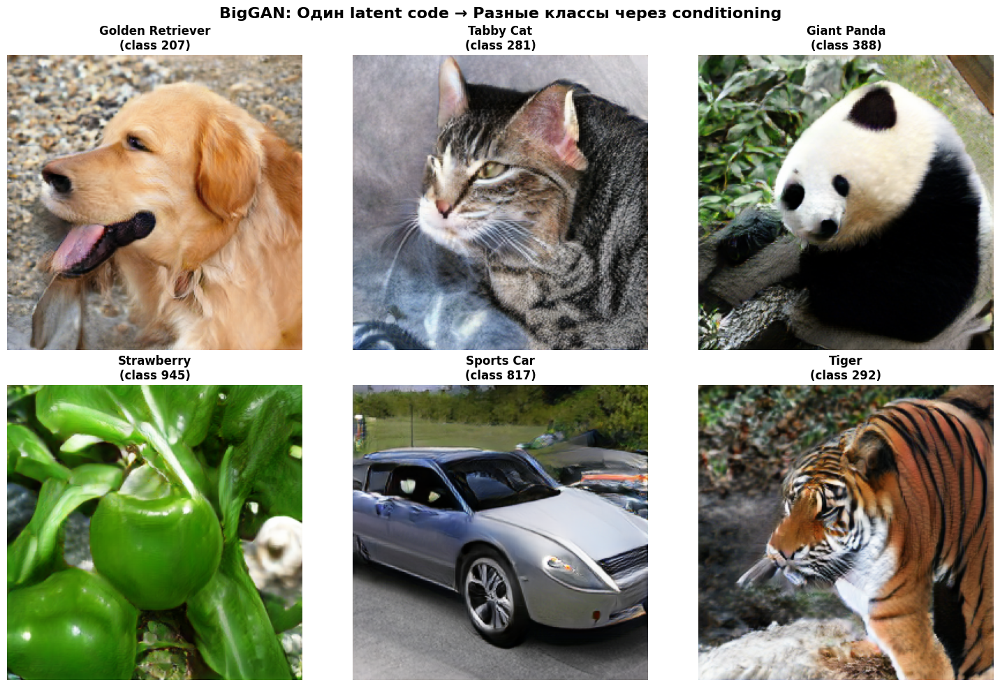

✓ Сохранено: biggan_results.png

TRUNCATION TRICK: Quality vs Diversity Trade-off


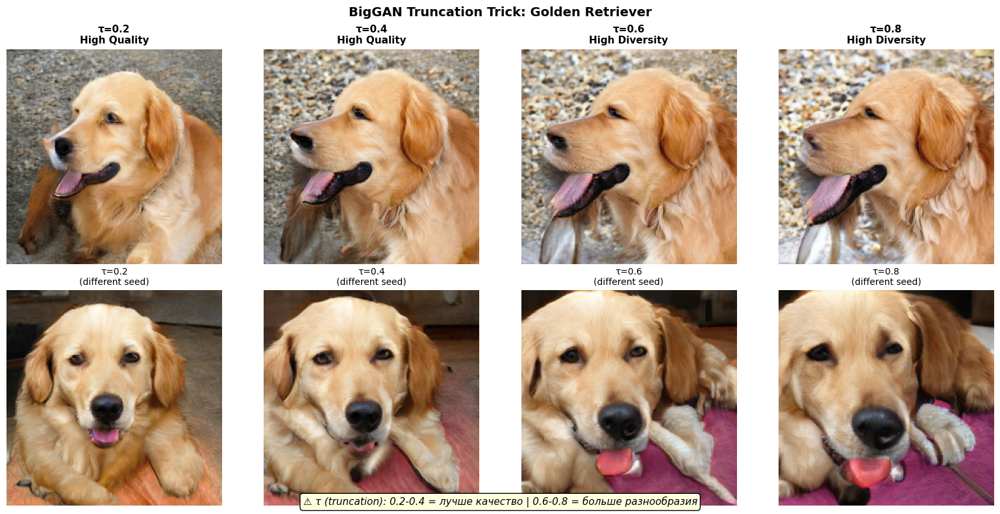

✓ Сохранено: biggan_truncation.png

Демонстрация: Класс полностью определяет объект


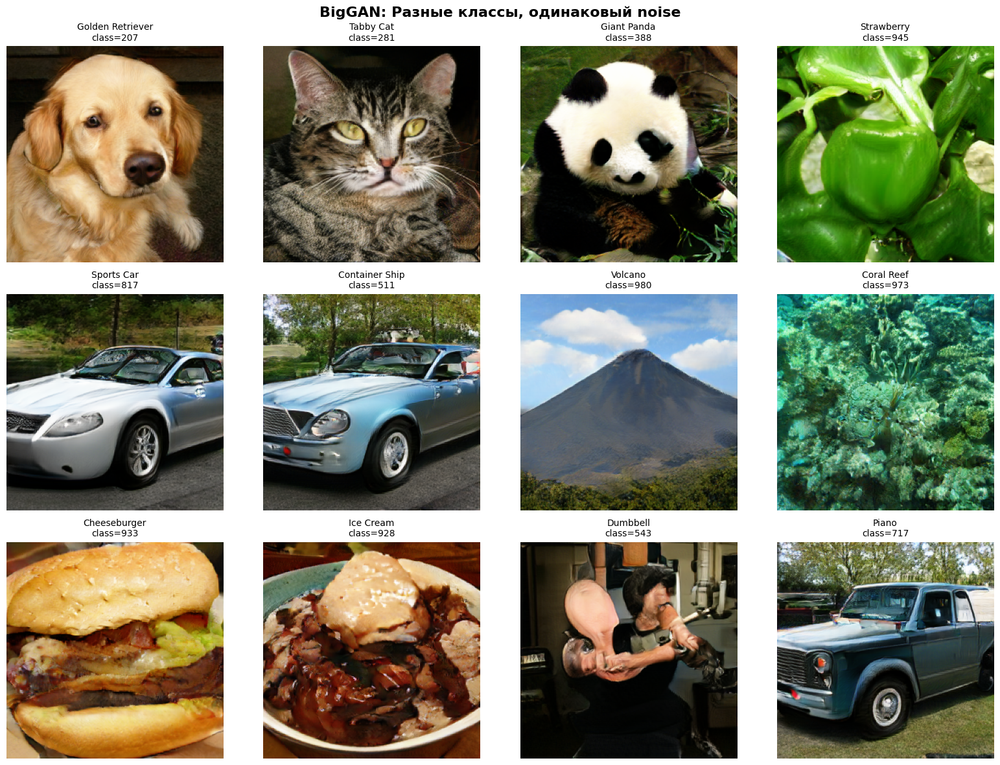

✓ Сохранено: biggan_classes.png

Демонстрация: Разнообразие внутри одного класса


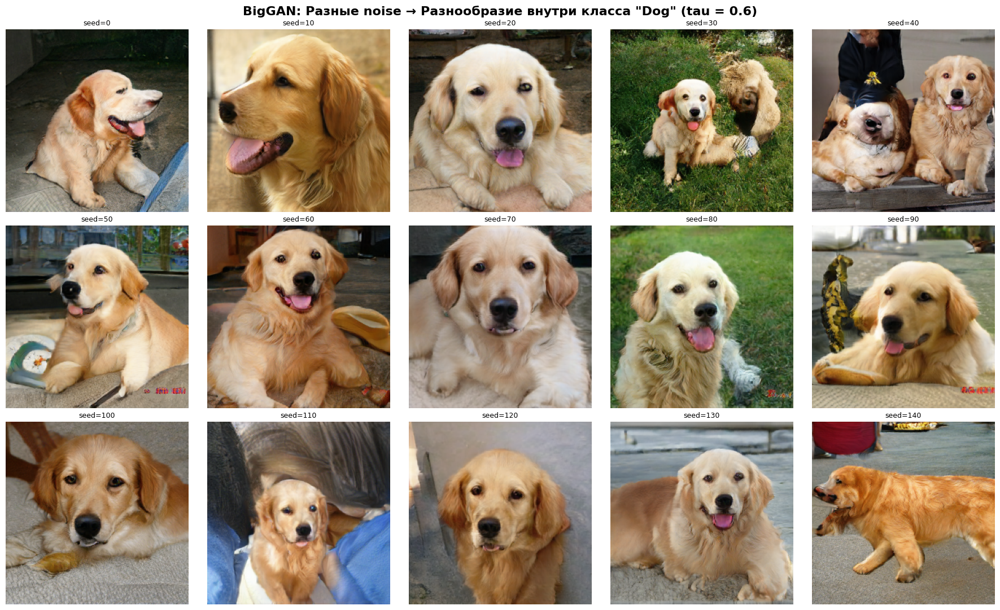

✓ Сохранено: biggan_diversity.png


In [7]:
# BigGAN: Генерация разных классов из одного noise (ИСПРАВЛЕНО)
# pip install pytorch-pretrained-biggan matplotlib

import torch
import matplotlib.pyplot as plt
from pytorch_pretrained_biggan import BigGAN, truncated_noise_sample
import numpy as np

# Загрузка модели
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = BigGAN.from_pretrained('biggan-deep-256')
model = model.to(device)
model.eval()

# Функция для отображения
def tensor_to_image(tensor):
    """Конвертация tensor → numpy image для matplotlib"""
    # Переводим на CPU и убираем batch dimension
    img = tensor.squeeze(0).cpu()
    
    # [C, H, W] → [H, W, C]
    img = img.permute(1, 2, 0).numpy()
    
    # Denormalize: [-1, 1] → [0, 1]
    img = (img + 1) / 2.0
    img = np.clip(img, 0, 1)
    
    return img

# ============================================
# ДЕМОНСТРАЦИЯ 1: Один noise → Разные классы
# ============================================

print("="*60)
print("BigGAN: Один noise → Разные объекты через class conditioning")
print("="*60)

# Один и тот же noise для всех классов
noise = truncated_noise_sample(
    truncation=0.5, 
    batch_size=1, 
    seed=42  # фиксируем seed для воспроизводимости
)
noise = torch.from_numpy(noise).to(device)  # ← ВАЖНО: numpy → tensor

# Разные классы ImageNet
classes = {
    'Golden Retriever': 207,
    'Tabby Cat': 281,
    'Giant Panda': 388,
    'Strawberry': 945,
    'Sports Car': 817,
    'Tiger': 292
}

# Генерация изображений
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('BigGAN: Один latent code → Разные классы через conditioning', 
             fontsize=16, fontweight='bold')

for idx, (class_name, class_id) in enumerate(classes.items()):
    # One-hot encoding для класса
    class_vector = torch.zeros(1, 1000).to(device)
    class_vector[:, class_id] = 1
    
    # Генерация
    with torch.no_grad():
        output = model(noise, class_vector, 0.5)  # truncation=0.5
    
    # Визуализация
    ax = axes[idx // 3, idx % 3]
    img = tensor_to_image(output)
    ax.imshow(img)
    ax.set_title(f'{class_name}\n(class {class_id})', fontsize=12, fontweight='bold')
    ax.axis('off')

plt.tight_layout()
plt.savefig('biggan_results.png', dpi=150, bbox_inches='tight')
plt.show()

print("✓ Сохранено: biggan_results.png")

# ============================================
# ДЕМОНСТРАЦИЯ 2: Truncation Trick
# ============================================

print("\n" + "="*60)
print("TRUNCATION TRICK: Quality vs Diversity Trade-off")
print("="*60)

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
truncations = [0.2, 0.4, 0.6, 0.8]

# Класс: Golden Retriever
class_vector = torch.zeros(1, 1000).to(device)
class_vector[:, 207] = 1

for row in range(2):
    # Разные seeds для каждой строки
    seed = 42 + row
    
    for col, trunc in enumerate(truncations):
        # Генерируем новый noise с фиксированным seed
        noise = truncated_noise_sample(
            truncation=trunc,
            batch_size=1,
            seed=seed
        )
        noise = torch.from_numpy(noise).to(device)
        
        with torch.no_grad():
            output = model(noise, class_vector, trunc)
        
        ax = axes[row, col]
        ax.imshow(tensor_to_image(output))
        
        if row == 0:
            quality_label = "High Quality" if trunc <= 0.4 else "High Diversity"
            ax.set_title(f'τ={trunc}\n{quality_label}', fontsize=11, fontweight='bold')
        else:
            ax.set_title(f'τ={trunc}\n(different seed)', fontsize=10)
        
        ax.axis('off')

fig.suptitle('BigGAN Truncation Trick: Golden Retriever', 
             fontsize=14, fontweight='bold')

# Добавляем пояснение
fig.text(0.5, 0.02,
         '⚠️ τ (truncation): 0.2-0.4 = лучше качество | 0.6-0.8 = больше разнообразия',
         ha='center', fontsize=11, style='italic',
         bbox=dict(boxstyle='round', facecolor='lightyellow'))

plt.tight_layout()
plt.savefig('biggan_truncation.png', dpi=150, bbox_inches='tight')
plt.show()

print("✓ Сохранено: biggan_truncation.png")

# ============================================
# ДЕМОНСТРАЦИЯ 3: Класс влияет на ВСЁ
# ============================================

print("\n" + "="*60)
print("Демонстрация: Класс полностью определяет объект")
print("="*60)

fig, axes = plt.subplots(3, 4, figsize=(16, 12))
fig.suptitle('BigGAN: Разные классы, одинаковый noise', 
             fontsize=16, fontweight='bold')

# Выбираем интересные классы
interesting_classes = [
    (207, 'Golden Retriever'),
    (281, 'Tabby Cat'),
    (388, 'Giant Panda'),
    (945, 'Strawberry'),
    (817, 'Sports Car'),
    (511, 'Container Ship'),
    (980, 'Volcano'),
    (973, 'Coral Reef'),
    (933, 'Cheeseburger'),
    (928, 'Ice Cream'),
    (543, 'Dumbbell'),
    (717, 'Piano')
]

# Фиксированный noise
fixed_noise = truncated_noise_sample(truncation=0.5, batch_size=1, seed=123)
fixed_noise = torch.from_numpy(fixed_noise).to(device)

for idx, (class_id, class_name) in enumerate(interesting_classes):
    class_vector = torch.zeros(1, 1000).to(device)
    class_vector[:, class_id] = 1
    
    with torch.no_grad():
        output = model(fixed_noise, class_vector, 0.5)
    
    ax = axes[idx // 4, idx % 4]
    ax.imshow(tensor_to_image(output))
    ax.set_title(f'{class_name}\nclass={class_id}', fontsize=10)
    ax.axis('off')

plt.tight_layout()
plt.savefig('biggan_classes.png', dpi=150, bbox_inches='tight')
plt.show()

print("✓ Сохранено: biggan_classes.png")

# ============================================
# ДЕМОНСТРАЦИЯ 4: Разнообразие внутри класса
# ============================================

print("\n" + "="*60)
print("Демонстрация: Разнообразие внутри одного класса")
print("="*60)

fig, axes = plt.subplots(3, 5, figsize=(18, 11))
fig.suptitle('BigGAN: Разные noise → Разнообразие внутри класса "Dog" (tau = 0.6)', 
             fontsize=16, fontweight='bold')

# Класс: Golden Retriever
class_vector = torch.zeros(1, 1000).to(device)
class_vector[:, 207] = 1

truncation = 0.6  # средний уровень для баланса

for idx in range(15):
    noise = truncated_noise_sample(truncation=truncation, batch_size=1, seed=idx*10)
    noise = torch.from_numpy(noise).to(device)
    
    with torch.no_grad():
        output = model(noise, class_vector, truncation)
    
    ax = axes[idx // 5, idx % 5]
    ax.imshow(tensor_to_image(output))
    ax.set_title(f'seed={idx*10}', fontsize=9)
    ax.axis('off')

plt.tight_layout()
plt.savefig('biggan_diversity.png', dpi=150, bbox_inches='tight')
plt.show()

print("✓ Сохранено: biggan_diversity.png")

## 4.2 StyleGAN

![stylegan_1](assets/stylegan.png)

### Идея

**StyleGAN** — это GAN с управляемым стилем генерации изображений, позволяющий контролировать детали на разных масштабах.  

Основные нововведения:

1. **Mapping Network** — проекция латентного вектора в «стильное» пространство  
2. **Adaptive Instance Normalization (AdaIN)**  
3. **Progressive Growing** (в StyleGAN1)  
4. **Noise Injection** — случайные детали на разных уровнях  
5. **Style Mixing** — комбинирование стилей разных латентных векторов
6. **Learnable constant input** - константа отвечает за исходную точку генерации
7. **Multi-scale генерация** (ToRGB / FromRGB)


Модель была представлена в:

**Karras et al., 2019 — "A Style-Based Generator Architecture for Generative Adversarial Networks"**

---

### Постановка задачи

StyleGAN — это **unconditional GAN**, но с возможностью управлять стилем генерации:

Generator получает:

$ z \sim \mathcal{N}(0, I) $  

Mapping Network проецирует $z$ в промежуточное пространство $w$:

$$
w = f(z)
$$

Генератор генерирует изображение через последовательность блоков с контролем стиля:

$$
x_{fake} = G(w)
$$

Дискриминатор:

$$
D(x) ∈ \mathbb{R}
$$

оценивает только реальность изображения (без класса).


> На практике используется не один стиль, а набор: $$ w \rightarrow (w_1, w_2, ..., w_L) $$ где каждый слой генератора получает свой стиль. $$ W^+ = \mathbb{R}^{L \times d}$$


---

### Loss функция

Стандартный non-saturating GAN loss с R1 регуляризацией для дискриминатора:

#### Discriminator (Non-saturating loss with softplus)
$$
\mathcal{L}_D = \mathbb{E}_{z \sim p(z)}[\text{softplus}(D(G(z)))] + \mathbb{E}_{x \sim p_r}[\text{softplus}(-D(x))] + \lambda \, R_1
$$

где $\text{softplus}(x) = \log(1 + e^x)$.

#### Generator
$$
\mathcal{L}_G = \mathbb{E}_{z \sim p(z)}[\text{softplus}(-D(G(z)))]
$$

**R1 регуляризация:**
$$
R_1 = \frac{\gamma}{2} \mathbb{E}_{x \sim p_r}[\|\nabla D(x)\|^2]
$$
где $\gamma$ — вес регуляризации (обычно 10).

---

### Архитектура Generator

#### Learnable Constant Input

Вместо использования $z$ напрямую, генератор начинается с **обучаемого тензора**:

$$
x_0 \in \mathbb{R}^{4 \times 4 \times 512}
$$

**Важные свойства:**
- Один и тот же для всех изображений
- Обучается как параметр сети
- Разнообразие создаётся через **стили** $w$ в AdaIN

**Почему это работает?**
- $x_0$ — это базовая "заготовка" изображения (learned prior)
- Стили $w$ модулируют эту заготовку → создают разные изображения
- Уменьшает entanglement в латентном пространстве

#### Mapping Network

Латентный вектор $z \in \mathbb{R}^{512}$ проходит через 8 fully-connected слоёв c LeakyReLU:

$$
w = f(z), \quad f: \mathcal{Z} \rightarrow \mathcal{W}
$$

**Зачем это нужно?**
- Распутывает латентное пространство
- $\mathcal{W}$ более линейное, чем $\mathcal{Z}$
- Упрощает интерполяцию и манипуляцию атрибутами

---

#### Adaptive Instance Normalization (AdaIN)

Ключевой механизм StyleGAN:

В обычной InstanceNorm:

$$
\hat{x} = \frac{x - \mu(x)}{\sigma(x)}
$$

В StyleGAN через стиль $w$:

$$
\text{AdaIN}(x_i, w) = y_{s,i} \frac{x_i - \mu(x_i)}{\sigma(x_i)} + y_{b,i}
$$

где:
- $y_{s,i} = \gamma_i(w)$ — style scale (из аффинного преобразования $w$)
- $y_{b,i} = \beta_i(w)$ — style bias (из аффинного преобразования $w$)
- $\mu(x_i), \sigma(x_i)$ — mean и std по пространственным размерностям канала $i$

**Важно:** 
- Для каждого слоя свои $\gamma, \beta$ вычисляются из $w$
- Обычно через FC: $w \to (\gamma, \beta)$

> В задачах style transfer стиль определяется через **Gram matrix**: $$ G_{ij} = \sum_k F_{ik}F_{jk}$$ где: $F$ — feature maps.
> Gram matrix описывает корреляции между каналами → текстуру.
> StyleGAN использует упрощённую идею: стиль ≈ статистики признаков
> AdaIN управляет: $\mu, \sigma$ - что уже достаточно для контроля текстуры.
---

#### Noise Injection

На каждом блоке добавляется шум:

$$
x \leftarrow x + b \cdot \epsilon
$$

где:

$$
\epsilon \sim \mathcal{N}(0,1)
$$

$b$ — обучаемый параметр.

Шум контролирует:

- поры кожи
- волосы
- текстуры

Важно: шум влияет только на детали, не на структуру.


#### Схема Generator

```
z
↓
Mapping Network f
↓
w

learnable_constant
↓
ConvBlock + AdaIN(style(w)) + Noise
↓
Upsample
↓
ConvBlock + AdaIN(style(w)) + Noise
↓
...
↓
ToRGB (1×1 conv на каждом уровне)
↓
Output x_fake

```

---

### Архитектура Discriminator

```
Input image

↓
FromRGB (1×1 conv)

↓
ResBlock + Downsample

↓
ResBlock + Downsample

↓
...

↓
MiniBatch StdDev

↓
Conv

↓
Dense

↓
Output D(x)
```

#### Residual Block

```
        x
        │
        ├───────────────┐
        │               │
      Conv            Conv 1×1
        │               │
      ReLU          Downsample
        │               │
      Conv              │
        │               │
    Downsample          │
        │               │
        └─────── + ─────┘
                │
                y
```

#### MiniBatch Standard Deviation Layer

Добавляется **перед финальными слоями** дискриминатора.

**Алгоритм:**
1. Вычислить std по каждому пикселю и каналу **across batch**:
   $$
   \sigma_{hw} = \sqrt{\frac{1}{N}\sum_{n=1}^N (x_{nhw} - \mu_{hw})^2}
   $$
2. Усреднить std по всем пикселям и каналам:
   $$
   \sigma = \frac{1}{HWC}\sum_{h,w,c} \sigma_{hwc}
   $$
3. Создать **дополнительный канал** размера $H \times W$, заполненный значением $\sigma$
4. Конкатенировать с features: $[x, \sigma]$

**Зачем это нужно?**
- Если генератор создаёт одинаковые изображения → $\sigma \approx 0$
- Дискриминатор видит низкую variance → понимает, что это fake
- **Борется с mode collapse**


**Помогает обнаруживать mode collapse.**

Если изображения одинаковые: variance ≈ 0


#### Финальный слой

Дискриминатор возвращает:

$$
D(x) \in \mathbb{R}
$$

Это: logit / score, не вероятность.

---

### Truncation Trick

Метод для **улучшения качества** генерации за счёт **снижения разнообразия**.

**Идея:** семплировать $z$ не из полного $\mathcal{N}(0,I)$, а из усечённого распределения.

**В пространстве $\mathcal{W}$:**
$$
w' = \bar{w} + \psi (w - \bar{w})
$$

где:
- $\bar{w}$ — среднее значение $w$ (обычно вычисляется на большой выборке)
- $\psi \in [0, 1]$ — truncation parameter

**Эффект:**
- $\psi = 1$: полное разнообразие, но могут быть артефакты
- $\psi = 0.7$: высокое качество, меньше разнообразия
- $\psi = 0$: всегда среднее лицо

**Применяется только на inference**, не при обучении.

----

### Style Mixing

Комбинирование стилей из двух латентных векторов $z_1, z_2$:

$$
z_1 \to w_1, \quad z_2 \to w_2
$$

**Важно:** разные уровни управляют разными атрибутами:

| Уровни | Разрешение | Контролируемые атрибуты |
|--------|------------|-------------------------|
| **Coarse (низкие)** | 4×4 – 8×8 | Поза, форма лица, причёска |
| **Middle (средние)** | 16×16 – 32×32 | Черты лица, глаза, нос, рот |
| **Fine (высокие)** | 64×64 – 1024×1024 | Цвет, текстура кожи, волосы |


```
z₁ → w₁ (coarse styles) → поза, форма
↓
z₂ → w₂ (fine styles) → текстура, детали
↓
x_fake
    
```
**Пример:**
- $w_1$ на coarse layers → форма лица от человека 1
- $w_2$ на fine layers → цвет кожи и глаз от человека 2

---

### Progressive Growing (StyleGAN1)


**Progressive Growing** — это метод обучения GAN для стабильной генерации изображений высокого разрешения.  
Основная идея: **сначала обучаем сеть на маленьком разрешении, затем постепенно добавляем слои для увеличения размера изображения**
- Генератор и дискриминатор растут вместе с увеличением разрешения  
- Каждая новая ступень плавно добавляется через weighted sum  
- Позволяет стабилизировать обучение высоких разрешений

Обучение:

$$
4×4
\rightarrow
8×8
\rightarrow
16×16
\rightarrow
...
\rightarrow
1024×1024
$$

Смешивание уровней:

$$ x = (1-\alpha) x_{old} + \alpha x_{new} $$

#### Шаги обучения

**Шаг1: Низкое разрешение**

- Генератор и дискриминатор работают на маленьких изображениях (например, $4 \times 4$ пикселя).  
- Сеть учится базовым формам и структуре изображения, не деталям.

$$
z \sim \mathcal{N}(0,I), \quad x_\text{fake}^{4\times4} = G_\text{small}(z)
$$

Дискриминатор:

$$
D_\text{small}(x_\text{real}^{4\times4}) \quad \text{и} \quad D_\text{small}(x_\text{fake}^{4\times4})
$$

Loss вычисляется стандартно:

$$
\mathcal{L}_D = - \mathbb{E}[\log D(x_\text{real})] - \mathbb{E}[\log(1 - D(x_\text{fake}))]
$$


**Шаг2: Постепенное добавление слоёв**

- Добавляем новые слои в генератор и дискриминатор → увеличиваем разрешение (например, $4 \times 4 \to 8 \times 8 \to 16 \times 16$).  
- Для плавного перехода используется **weighted sum**:

$$
x_\text{out} = (1 - \alpha) \cdot x_\text{old} + \alpha \cdot x_\text{new}, \quad \alpha \in [0,1]
$$

- $\alpha$ постепенно растёт от $0$ до $1$, чтобы новые слои постепенно брали на себя генерацию.

**Шаг3: Финальное высокое разрешение**

- После подключения всех слоёв сеть обучается на полном разрешении (например, $1024 \times 1024$).  
- Генератор умеет создавать реалистичные детали, дискриминатор — проверять их.

$$
x_\text{fake}^{1024\times1024} = G_\text{full}(z), \quad D_\text{full}(x_\text{real}^{1024\times1024}, x_\text{fake}^{1024\times1024})
$$


### ToRGB блоки и MixedReslolution

Каждый уровень resolution имеет свой **ToRGB** блок (1×1 convolution):

$$
x_\text{rgb}^{(i)} = \text{Conv}_{1\times1}(h^{(i)})
$$

где $h^{(i)}$ — feature maps на уровне $i$.

**Финальный выход:**
- В StyleGAN1 (с progressive growing): используется skip connections
- В StyleGAN2: используется только финальный ToRGB

> Могут быть также использованы мульти-выходы (опционально, ProGAN): $$ x_\text{final} = \text{ToRGB}_n(h_n) + \text{Upsample}\left(\text{ToRGB}_{n-1}(h_{n-1}) \text{Upsample}(...)\right) $$

---

### Достоинства

- Полный контроль над стилем генерации  
- Высокая реалистичность изображений  
- Возможность тонкой манипуляции атрибутами
- Cтабильное обучение

### Бонус: StyleGAN2 (важные изменения)

#### 1. Weight Demodulation (вместо AdaIN)

**Проблема AdaIN:** создавал artifacts (droplet-like blobs).

**Решение:** модулировать **веса свёртки**, а не активации.

**Weight Modulation:**
$$
w'_{ijk} = s_i \cdot w_{ijk}
$$
где $s_i = \gamma_i(w)$ — style scale для канала $i$.

**Demodulation:**
$$
w''_{ijk} = \frac{w'_{ijk}}{\sqrt{\sum_{i,k} (w'_{ijk})^2 + \epsilon}}
$$

Нормализация предотвращает взрыв/затухание сигнала.

#### 2. Убрали Progressive Growing

- Используется **skip connections** (residual paths)
- **Bilinear filtering** для upsampling/downsampling
- Стабильнее обучение без fade-in

#### 3. Path Length Regularization

Новая регуляризация для более smooth латентного пространства:
$$
\mathcal{L}_\text{path} = \mathbb{E}_{w,y} \left[ \left\| J_w^T y - a \right\|^2 \right]
$$
где $J_w$ — Jacobian генератора, $a$ — moving average.

#### 4. Lazy Regularization

R1 и path length регуляризации применяются **не на каждой итерации**, а раз в 16 шагов → ускорение обучения.

## 4.3 CycleGAN

![cyclegan2](assets/cyclegan_2.png)

### Идея

**CycleGAN** — это GAN для **неконтролируемого преобразования изображений из одного домена в другой** без парных примеров.  

Основные нововведения:

1. **Cycle Consistency Loss** — сохраняет содержимое при переводе между доменами  
2. **Two Generators + Two Discriminators** — $G: X \to Y$, $F: Y \to X$, $D_X$, $D_Y$  
3. **PatchGAN Discriminator** — оценивает локальные патчи изображения  
4. **Unpaired Image Translation** — обучение без парных данных  

Модель была представлена в:

**Zhu et al., 2017 — "Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks"**

---

### Постановка задачи

Есть два домена изображений:  

$$ X, Y $$

Цель: научиться переводить изображение из одного домена в другой:

$$
G: X \rightarrow Y, \quad F: Y \rightarrow X
$$

Дискриминаторы:

$$
D_Y \text{ различает } y \in Y \text{ и } G(x) \in Y
$$

$$
D_X \text{ различает } x \in X \text{ и } F(y) \in X
$$

**Важно:** обучение без парных $(x, y)$ — нужно сохранять структуру через **cycle-consistency**.

---

### Loss функции

#### Adversarial Loss (LSGAN)

**Для дискриминатора** $D_Y$:
$$
\mathcal{L}_{D_Y} = \mathbb{E}_{y \sim p_{data}(Y)}[(D_Y(y) - 1)^2] + \mathbb{E}_{x \sim p_{data}(X)}[D_Y(G(x))^2]
$$

**Для генератора** $G$:
$$
\mathcal{L}_{G} = \mathbb{E}_{x \sim p_{data}(X)}[(D_Y(G(x))-1)^2]
$$

Аналогично для $F$ и $D_X$.

---

#### Cycle Consistency Loss

Чтобы $x \approx F(G(x))$ и $y \approx G(F(y))$:

$$
\mathcal{L}_{cyc}(G, F) = \mathbb{E}_{x \sim p_{data}(X)}[\| F(G(x)) - x \|_1] + \mathbb{E}_{y \sim p_{data}(Y)}[\| G(F(y)) - y \|_1]
$$

> Сохраняет структуру изображения при переводе между доменами.

---

### Identity Loss (опционально)

Если хотим сохранить цветовую палитру:

$$
\mathcal{L}_{idt}(G,F) = \mathbb{E}_{y \sim p_{data}(Y)}[\| G(y)-y \|_1] + \mathbb{E}_{x \sim p_{data}(X)}[\| F(x)-x \|_1]
$$

- Полезно, если нужно, чтобы генератор не менял уже правильный домен
---

#### Total Loss

$$
\mathcal{L}(G,F,D_X,D_Y) = \mathcal{L}_{GAN}(G,D_Y) + \mathcal{L}_{GAN}(F,D_X) + \lambda \, \mathcal{L}_{cyc}(G,F) + \lambda_{idt} \, \mathcal{L}_{idt}(G,F)
$$

где $\lambda = 10$, $\lambda_{idt} = 0.5 \times \lambda = 5$ (опционально).

---

### Архитектура Generator

CycleGAN использует **ResNet-based или U-Net генератор**.
```
Input x
↓
Conv 7x7 + InstanceNorm + ReLU
↓
Downsampling Conv 3x3 (stride=2) + InstanceNorm + ReLU ×2
↓
Residual Blocks (6 или 9 блоков)
↓
Upsampling (TransposedConv) + InstanceNorm + ReLU ×2
↓
Conv 7x7 + Tanh
↓
Output y_hat
```

- Residual Blocks ```x → Conv 3x3 + InstanceNorm + ReLU → Conv 3x3 + InstanceNorm → (+) x → out``` 
- Upsampling + Conv восстанавливают размер изображения  

> Обычно вход/выход — 256×256 RGB

---

### Архитектура Discriminator

**PatchGAN** — оценивает локальные патчи изображения (например, 70×70):

```
Input image
↓
Conv 4x4, stride=2 + LeakyReLU(0.2)
↓
Conv 4x4, stride=2 + InstanceNorm + LeakyReLU(0.2) ×2
↓
Conv 4x4, stride=1 + InstanceNorm + LeakyReLU(0.2)
↓
Conv 4x4, stride=1
↓
Output N×N patch scores
```

- Каждый выход patch — вероятность реального патча  
- Позволяет сосредоточиться на текстуре и мелких деталях  

> Не оценивает целое изображение, только локальные патчи

---

### Cycle Consistency

Идея в картинках:

```
x ∈ X
↓ G
G(x) ≈ y_hat ∈ Y
↓ F
F(G(x)) ≈ x_hat ≈ x

y ∈ Y
↓ F
F(y) ≈ x_hat ∈ X
↓ G
G(F(y)) ≈ y_hat ≈ y
```


> Это предотвращает «беспорядочные» переводы, когда структура теряется.

---

#### Image Buffer (History Buffer)
- Хранит последние 50 сгенерированных изображений
- Дискриминатор обучается на смеси текущих и прошлых изображений
- Предотвращает колебания в обучении

### Итоговая схема обучения

```
x ∈ X -----------------→ G → y_hat
| ↓
| F → x_cycle
| ↑
x_cycle ← F ← y_hat ← G(x)

y ∈ Y -----------------→ F → x_hat
| ↓
| G → y_cycle
| ↑
y_cycle ← G ← x_hat ← F(y)
```

- D_X оценивает x и F(y)  
- D_Y оценивает y и G(x)  
- Генераторы оптимизируются по GAN + cycle loss + identity loss  

---

### Достоинства

- Работа с непарными датасетами  
- Сохраняет структуру и контент исходного изображения  
- Локальный PatchGAN улучшает текстуры  
- Гибкая архитектура генератора (ResNet / U-Net)  

### Ограничения
- Иногда создаёт артефакты при сильной трансформации (особенно геометрической)
- Не всегда стабилен при больших разрешениях (>512×512)
- Требует балансировки GAN и cycle loss
- Mode collapse — может игнорировать вход и генерировать одинаковые выходы
- Большое время обучения — требует ~200 эпох на стандартных датасетах
- Высокие требования к памяти — особенно при высоком разрешении
- Не подходит для задач с сильным изменением геометрии (например, кошка → собака)

## 5 Hybrid Models: VAE + GAN

![vae_gan](assets/vae_gan.png)

### Идея

**Hybrid Models (VAE-GAN)** объединяют **Variational Autoencoder (VAE)** и **Generative Adversarial Network (GAN)** для генерации реалистичных изображений без размытости, присущей классическим VAE.  

Основные нововведения:

1. **VAE backbone** — энкодер-декодер сохраняет латентное пространство  
2. **GAN discriminator** — обеспечивает высокое качество, sharp детали  
3. **Perceptual / Feature Matching Loss** — сохраняет структуру изображения  
4. **Combined loss** — reconstruction + KL + adversarial  

Модель была представлена в:

**Larsen et al., 2016 — "Autoencoding beyond pixels using a learned similarity metric"**

---

### Постановка задачи

**VAE:** реконструирует изображение через латентный код $z$:

$$
x \xrightarrow{Encoder} z \sim q_\phi(z|x) \quad \xrightarrow{Decoder} \hat{x}
$$

**Проблема VAE:** использование pixel-wise loss (например, L2) → **размытие изображений**  

**Решение:** добавить **GAN discriminator**, который оценивает реалистичность $\hat{x}$:

- Генератор = VAE Decoder $G(z)$  
- Дискриминатор $D(x)$ → различает реальные $x$ и реконструкции $\hat{x}$  

---

### Loss функция

Hybrid VAE-GAN использует **три компонента**:

1. **VAE Reconstruction Loss (feature space / perceptual)**

$$
\mathcal{L}_\text{rec} = \| f(x) - f(\hat{x}) \|_2^2
$$

где $f(\cdot)$ — features из промежуточного слоя дискриминатора (или VGG).  

2. **KL Divergence Loss**

$$
\mathcal{L}_\text{KL} = D_\text{KL}\big(q_\phi(z|x) \| p(z)\big)
$$

- Как в классическом VAE  
- Сохраняет регуляризацию латентного пространства  

3. **Adversarial Loss (GAN)**

#### Discriminator
$$
\mathcal{L}_D = -\mathbb{E}_{x \sim p_\text{data}}[\log D(x)] - \mathbb{E}_{z \sim q_\phi(z|x)}[\log(1 - D(G(z)))]
$$

#### Generator / Decoder
$$
\mathcal{L}_G = - \mathbb{E}_{z \sim q_\phi(z|x)}[\log D(G(z))]
$$

**Итоговый комбинированный loss для генератора:**

$$
\mathcal{L}_\text{VAE-GAN} = \mathcal{L}_\text{rec} + \beta \, \mathcal{L}_\text{KL} + \gamma \, \mathcal{L}_G
$$

- $\beta, \gamma$ — веса компонентов  
- $\mathcal{L}_\text{rec}$ в feature space делает изображения sharp  

---

### Архитектура

#### Encoder

- CNN → латентный вектор $z$  
- Выход: $q_\phi(z|x) = \mathcal{N}(\mu(x), \sigma^2(x))$  
- Reparameterization trick: $z = \mu + \sigma \odot \epsilon, \; \epsilon \sim \mathcal{N}(0, I)$  

#### Decoder / Generator

- Восстанавливает изображение из $z$  
- Обучается на **feature reconstruction** + **GAN loss**  
- Multi-scale или residual blocks возможны для улучшения деталей  

#### Discriminator

- PatchGAN или стандартный CNN discriminator  
- Оценивает реализм реконструкции $\hat{x}$  
- Применяется к feature loss и adversarial loss  

---

### Схема VAE-GAN

```
Input x
↓
Encoder q_phi(z|x)
↓
Latent z
↓
Decoder / Generator G(z)
↓
Reconstructed image x_hat
↓
Discriminator D
→ Feature extraction for L_rec
→ Real / Fake classification

```


> Feature-based reconstruction loss уменьшает blur и сохраняет структуру.

---

### Почему это работает

1. **VAE** сохраняет компактное и регулярное латентное пространство → удобно для манипуляций и интерполяций  
2. **GAN** убирает размытие, делает изображения sharp  
3. **Feature loss** → сравнение по high-level признакам вместо пикселей → детализированная реконструкция  

---

### Достоинства

- Устранение размытия, характерного для VAE  
- Компактное латентное пространство для генерации и интерполяции  
- Возможность управляемой генерации и редактирования изображения  

### Применение

- Image reconstruction / denoising  
- Image-to-image translation  
- High-resolution генерация с сохранением структуры  
- Latent space manipulation и генерация новых образов


## 5.1 VQ-GAN

![vqgan](assets/vqgan.png)

### Идея

**VQ-GAN (Vector Quantized Generative Adversarial Network)** — это генеративная модель, которая объединяет **VQ-VAE** и **GAN**, чтобы генерировать высококачественные изображения с дискретным латентным пространством.  

Основные нововведения:

1. **VQ-VAE кодирование** — латентное представление дискретизируется через кодбук  
2. **Patch-based Discriminator (GAN)** — оценка реалистичности мелких патчей изображения  
3. **Perceptual Loss (VGG)** — помогает сохранить структуру и детали  
4. **Adversarial Loss** — повышает реализм изображений  
5. **Multi-scale Generator / Decoder** — декодирование латента в изображение высокого разрешения  

Модель была представлена в:

**Esser et al., 2021 — "Taming Transformers for High-Resolution Image Synthesis"**

---

### Постановка задачи

VQ-GAN использует **дискретное латентное пространство** $\mathcal{Z}$ из VQ-VAE:

$$
x \xrightarrow{Encoder} z_e(x) \in \mathbb{R}^{h \times w \times d} \xrightarrow{quantize} z_q(x) \in \mathcal{Z}^N
$$

- $z_e(x)$ — непрерывное кодирование  
- $z_q(x)$ — дискретизированное через **codebook** $e \in \mathbb{R}^{K \times d}$  
- $N = h \cdot w$ — количество латентных токенов  

Декодер $G$ восстанавливает изображение:

$$
\hat{x} = G(z_q(x))
$$

**GAN часть:** дискриминатор $D$ оценивает реализм $\hat{x}$ и $x$:

$$
D(x), D(\hat{x}) \in \mathbb{R}^{H' \times W'}
$$
$$

> В отличие от классического VQ-VAE, VQ-GAN использует adversarial loss для повышения качества изображений (остаются детали, текстуры).

---

### Loss функция

**Итоговая формула (компактная)**

$$
\mathcal{L} = \underbrace{\|x - \hat{x}\|_1}_{\text{reconstruction}} 
+ \underbrace{\| \text{sg}[z_e(x)] - e \|_2^2 + \beta \| z_e(x) - \text{sg}[e] \|_2^2}_{\text{codebook / commitment}}
+ \underbrace{\mathcal{L}_{GAN}}_{\text{adversarial}} 
+ \underbrace{\lambda \, \mathcal{L}_\text{VGG}}_{\text{perceptual}}
$$

**Типичные гиперпараметры:**
- $\beta = 0.25$
- $\lambda_{\text{GAN}} = 0.8$ или $1.0$
- $\lambda_{\text{P}} = 1.0$


**Adversarial Loss**

Discriminator:
$$
\mathcal{L}_D = \mathbb{E}_{x \sim p_{\text{data}}}[\max(0, 1 - D(x))] + \mathbb{E}_{\hat{x}}[\max(0, 1 + D(\hat{x}))]
$$

Generator:
$$
\mathcal{L}_{\text{GAN}} = -\mathbb{E}_{\hat{x}}[D(\hat{x})]
$$

**Perceptual Loss**

$$
\mathcal{L}_{\text{perceptual}} = \sum_{\ell} w_\ell \| \phi_\ell(x) - \phi_\ell(\hat{x}) \|_2^2
$$

где:
- $\phi_\ell$ — features из слоя $\ell$ pretrained VGG
- Обычно используют: `relu1_2, relu2_2, relu3_2, relu4_2, relu5_2`
- $w_\ell$ — веса для каждого слоя

---

### Архитектура Encoder / Decoder

#### Схема VQ-GAN
```
Input x
↓
Encoder (CNN + ResBlocks)
↓
Continuous latent z_e(x)
↓
Quantization (nearest codebook vector)
↓
Discrete latent z_q(x)
↓
Decoder (ResBlocks + Upsample)
↓
Reconstructed image x_hat
↓
Patch Discriminator D
```

Дополнительно: Perceptual Loss сравнивает `x` и `x_hat`.

#### Encoder

- CNN с strided convolutions → уменьшает разрешение $H \times W \to h \times w$  
- На выходе получаем **непрерывный латент $z_e(x)$**  
- Перед quantization применяется **layer normalization / residual blocks**  

#### Vector Quantization

**Процесс квантования:**

Для каждой позиции $(i,j)$ в латентной карте:

**1. Находим индекс ближайшего кода:**
$$
k^* = \arg \min_{k \in \{1,\dots,K\}} \| z_e^{(i,j)} - e_k \|_2
$$

**2. Заменяем на вектор из codebook:**
$$
z_q^{(i,j)} = e_{k^*}
$$

- **Codebook update:** EMA (Exponential Moving Average) для стабильного обучения

#### Decoder (Generator)

- Принимает $z_q(x)$ и восстанавливает изображение высокого разрешения  
- Используются **residual blocks + upsampling**  
- Multi-scale reconstruction: детали восстанавливаются через несколько слоёв декодера  

---

### Discriminator

**PatchGAN / Multi-scale Discriminator**:

Вместо одного скалярного выхода $D(x) \in \mathbb{R}$, PatchGAN выдаёт **карту**:

$$
D(x) \in \mathbb{R}^{H' \times W'}
$$

где каждый элемент оценивает **локальный патч** изображения.

- Оценивает **локальные патчи изображения**, а не глобально  
- Дискриминатор D работает на нескольких масштабах (например, $256\times256$ и $128\times128$)  


---

### Perceptual Loss (детально)

VQ-GAN использует **LPIPS** (Learned Perceptual Image Patch Similarity) или просто VGG-based loss.

#### Вариант 1: VGG-based (простой)

$$
\mathcal{L}_{\text{VGG}} = \sum_{\ell=1}^L \frac{1}{N_\ell} \| \phi_\ell(x) - \phi_\ell(\hat{x}) \|_2^2
$$

где:
- $\phi_\ell$ — **features из слоя** $\ell$ pretrained VGG16/19
- $N_\ell$ — количество элементов в слое $\ell$ (нормализация)
- Обычно используют слои: **relu1_2, relu2_2, relu3_2, relu4_2, relu5_2**
- 
#### Вариант 2: LPIPS (используется в статье)

**LPIPS = Learned weights для каждого слоя**

$$
\mathcal{L}_{\text{LPIPS}} = \sum_{\ell} w_\ell \cdot \frac{1}{H_\ell W_\ell} \sum_{h,w} \| \hat{\phi}_\ell^{hw}(x) - \hat{\phi}_\ell^{hw}(\hat{x}) \|_2^2
$$

где:
- $w_\ell$ — **learned weights** (обучены на human judgments)
- $\hat{\phi}_\ell$ — **normalized features** (unit norm в channel dimension)

**Зачем LPIPS?**
- VGG обучен на классификацию, не на perceptual similarity
- LPIPS **fine-tuned** на human perceptual judgments
- Лучше коррелирует с human perception


---
### Adaptive Discriminator Weight

**Проблема:** GAN loss может **доминировать** на ранних этапах обучения.

**Решение:** Adaptive weighting (из статьи)

$$
\lambda_{\text{GAN}}^{\text{adapt}} = \frac{\| \nabla_{G_{\text{last}}} \mathcal{L}_{\text{rec}} \|_2}{\| \nabla_{G_{\text{last}}} \mathcal{L}_{\text{GAN}} \|_2 + 10^{-4}}
$$

где:
- $G_{\text{last}}$ — последний слой декодера
- $\nabla_{G_{\text{last}}}$ — градиент по весам последнего слоя

**Идея:**
- Балансируем **magnitude градиентов** от reconstruction и GAN loss
- Если GAN градиенты слишком большие → уменьшаем $\lambda_{\text{GAN}}$
- Если reconstruction градиенты большие → увеличиваем $\lambda_{\text{GAN}}$
---

### Почему это работает

1. **Дискретное латентное пространство** — позволяет эффективно моделировать сложные структуры  
2. **GAN loss** — улучшает реализм и текстуры  
3. **Perceptual loss** — сохраняет семантическую структуру и детали  
4. **PatchGAN** — обеспечивает локальный контроль качества, борется с размытием  

> В отличие от классического VQ-VAE, VQ-GAN умеет генерировать **фотореалистичные изображения высокого разрешения**, сохраняя компактное латентное пространство для дальнейшей генерации или трансформации.

---

### Достоинства

- Высокое качество генерации (детали, текстуры)  
- Компактное дискретное латентное пространство  
- Возможность комбинировать с **Transformers для autoregressive generation**  
- Эффективное обучение даже на больших изображениях  

### Применение

- Генерация изображений (256×256 → 1024×1024)  
- Image-to-image трансформация  
- Text-to-image генерация (например, через CLIP + VQ-GAN)  
- Сжатие изображений с качественным восстановлением

### Ограничения VQ-GAN

1. Training complexity: балансировка 5 losses, GAN instability, warmup required
2. Not pixel-perfect: rFID=1.2 (не для medical/technical/OCR)
3. Long sequences: высокие разрешения → 1000+ tokens (дорого для Transformer)
4. Partial codebook collapse: ~5-10% unused codes
5. Computational cost: 2× медленнее VQ-VAE (discriminator + LPIPS)